In [93]:
# Cell 0 - Environment Setup
# Run this cell first if you are setting up for the first time

import subprocess
import sys

required_packages = [
    "opencv-python",
    "numpy",
    "matplotlib",
    "ultralytics",
    "lap>=0.5.12"
]

print("Checking required packages...")
for package in required_packages:
    try:
        __import__(package.replace("-", "_"))
        print(f"  ✓ {package}")
    except ImportError:
        print(f"  Installing {package}...")
        subprocess.run([sys.executable, "-m", "pip", "install", package])

print("\nAll packages ready. You can now run the remaining cells.")

Checking required packages...
  Installing opencv-python...
Defaulting to user installation because normal site-packages is not writeable


You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


  ✓ numpy
  ✓ matplotlib
  ✓ ultralytics
  Installing lap>=0.5.12...
Defaulting to user installation because normal site-packages is not writeable

All packages ready. You can now run the remaining cells.


You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


In [94]:
# Cell 1 - Imports & Environment Check
import cv2
import numpy as np
import matplotlib.pyplot as plt
import importlib
import pipeline_helpers
importlib.reload(pipeline_helpers)
from pipeline_helpers import (
    stabilize_zoi, build_zoi_mask, apply_mog2_mask,
    check_vehicle_in_zoi, get_debris_mask,
    evaluate_status, draw_frame
)

# Make images display inline in the notebook
%matplotlib inline

# Verify versions
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")
print("All imports successful!")

OpenCV version: 4.13.0
NumPy version: 2.0.2
All imports successful!


In [95]:
# Cell 1b - Pipeline Configuration
# ── Change these paths to switch videos or models ──────────────────────────
VIDEO_PATH  = "../videos/Rail-Grade-Crossing-StressTest.mov"

# Run 001 — pretrained YOLOv11n (COCO baseline)
# MODEL_PATH = "../models/yolo11n.pt"
# RUN_LABEL  = "run001_pretrained"

# Run 002 — fine-tuned weights (mAP50=0.9460, peak epoch 17, stopped epoch 31/50)
# 
MODEL_PATH = "../runs/detect/models/vehicle_finetune_v2/weights/best.pt"
RUN_LABEL  = "run002_finetuned" 
# ───────────────────────────────────────────────────────────────────────────

print(f"Video     : {VIDEO_PATH}")
print(f"Model     : {MODEL_PATH}")
print(f"Run label : {RUN_LABEL}")


Video     : ../videos/Rail-Grade-Crossing-StressTest.mov
Model     : ../runs/detect/models/vehicle_finetune_v2/weights/best.pt
Run label : run002_finetuned


Video opened successfully!
Total frames: 1027
FPS: 31.44679765246236
Resolution: 1772 x 872


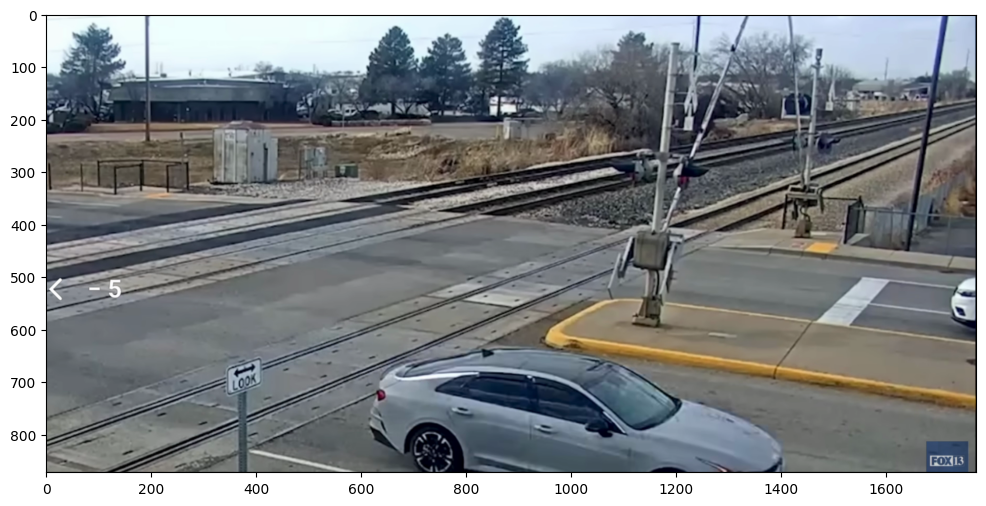

In [96]:
# Cell 2 - Load video and display first frame
video_path = VIDEO_PATH

# Open the video
cap = cv2.VideoCapture(video_path)

# Check it opened correctly
if not cap.isOpened():
    print("Error: Could not open video. Check the filename and path.")
else:
    print(f"Video opened successfully!")
    print(f"Total frames: {int(cap.get(cv2.CAP_PROP_FRAME_COUNT))}")
    print(f"FPS: {cap.get(cv2.CAP_PROP_FPS)}")
    print(f"Resolution: {int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))} x {int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))}")

    # Reads the first frame
    ret, frame = cap.read()

    if ret:
        # Converts BGR to RGB
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display it
        plt.figure(figsize=(12, 7))
        plt.imshow(frame_rgb)

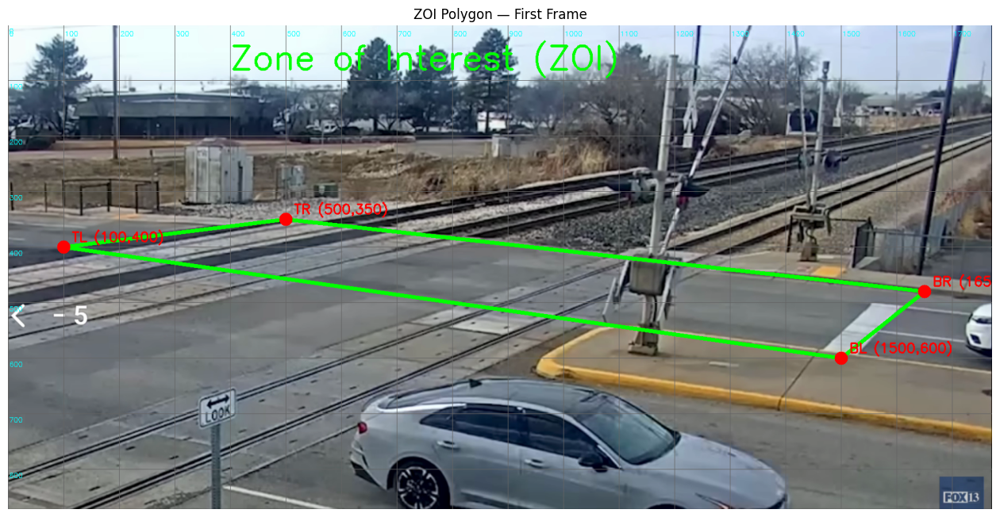

ZOI Points: [[100, 400], [500, 350], [1650, 480], [1500, 600]]


In [97]:
# Cell 3 - Define and Draw the ZOI Polygon on the First Frame
# Coordinate system: X increases right, Y increases down

cap = cv2.VideoCapture(video_path)
ret, frame = cap.read()
cap.release()

# Define the ZOI polygon — adjust points using grid lines as reference
zoi_points = np.array([
    [100, 400],  # TL
    [500, 350],  # TR
    [1650, 480],  # BR 
    [1500, 600],  # BL
], dtype=np.int32)

frame_zoi = frame.copy()
h, w = frame_zoi.shape[:2]

# Draw grid lines every 100 pixels for coordinate reference
for x in range(0, w, 100):
    cv2.line(frame_zoi, (x, 0), (x, h), (100, 100, 100), 1)
    cv2.putText(frame_zoi, str(x), (x + 2, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 0), 1)
for y in range(0, h, 100):
    cv2.line(frame_zoi, (0, y), (w, y), (100, 100, 100), 1)
    cv2.putText(frame_zoi, str(y), (2, y + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 0), 1)

# Draw ZOI polygon
cv2.polylines(frame_zoi, [zoi_points], isClosed=True, color=(0, 255, 0), thickness=5)

# Label each corner with red dot + coordinates
corner_labels = ["TL", "TR", "BR", "BL"]
for pt, label in zip(zoi_points, corner_labels):
    x, y = pt
    cv2.circle(frame_zoi, (x, y), 12, (0, 0, 255), -1)
    cv2.putText(frame_zoi, f"{label} ({x},{y})", (x + 15, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)

cv2.putText(frame_zoi, "Zone of Interest (ZOI)", (400, 80),
            cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 255, 0), 4)

frame_rgb = cv2.cvtColor(frame_zoi, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 9))
plt.imshow(frame_rgb)
plt.title("ZOI Polygon — First Frame")
plt.axis("off")
plt.show()
print(f"ZOI Points: {zoi_points.tolist()}")

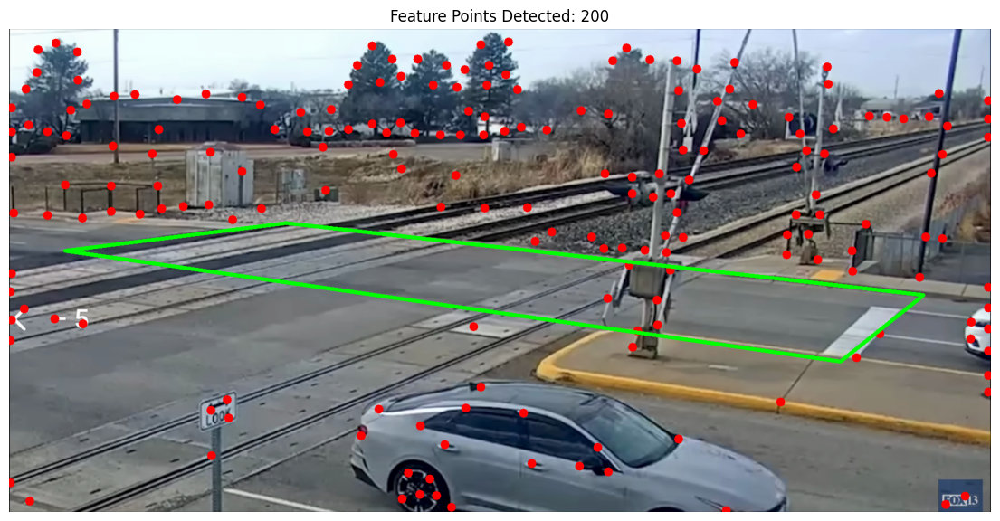

In [98]:
# Cell 4 - Detect Background Feature Points for Optical Flow
cap = cv2.VideoCapture(video_path)
ret, frame = cap.read()
cap.release()

# Convert to grayscale — optical flow works on grayscale
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Detect strong corner points in the background to track
# These are stable reference points the system will follow frame to frame
feature_params = dict(
    maxCorners=200,       # max number of points to track
    qualityLevel=0.01,    # minimum quality of points
    minDistance=30,       # minimum distance between points
    blockSize=7           # size of area considered around each point
)

feature_points = cv2.goodFeaturesToTrack(gray, **feature_params)

# Draw the detected points on the frame
frame_features = frame.copy()
for point in feature_points:
    x, y = point.ravel().astype(int)
    cv2.circle(frame_features, (x, y), 8, (0, 0, 255), -1)  # red dots

# Also draw the ZOI so we can see both together
cv2.polylines(frame_features, [zoi_points], isClosed=True, color=(0, 255, 0), thickness=5)

# Display
frame_rgb = cv2.cvtColor(frame_features, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(14, 8))
plt.imshow(frame_rgb)
plt.title(f"Feature Points Detected: {len(feature_points)}")
plt.axis("off")
plt.show()

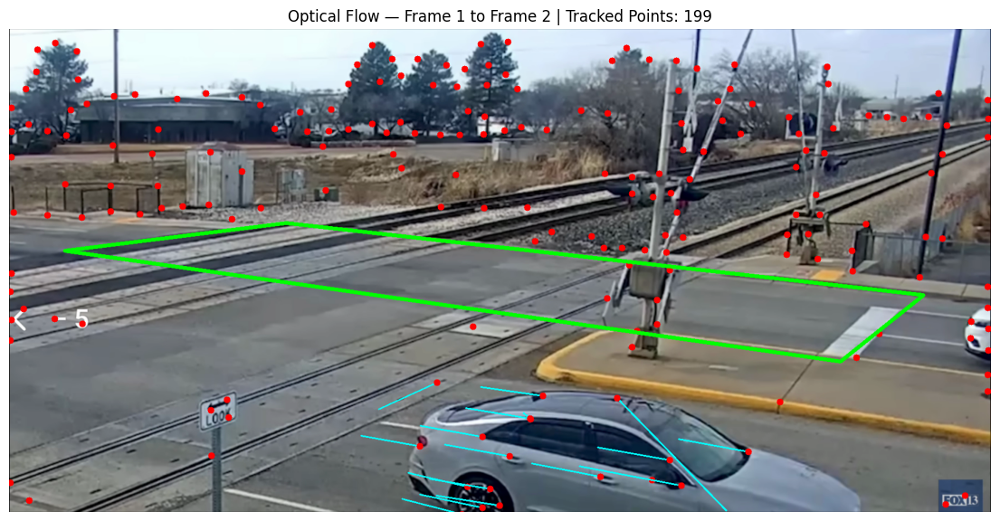

Points successfully tracked: 199 / 200


In [99]:
# Cell 5 - Lucas-Kanade Optical Flow between Frame 1 and Frame 2
cap = cv2.VideoCapture(video_path)

# Read frame 1
ret, frame1 = cap.read()
gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

# Detect feature points on frame 1
feature_points = cv2.goodFeaturesToTrack(gray1, **feature_params)

# Read frame 2
ret, frame2 = cap.read()
gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

cap.release()

# Lucas-Kanade optical flow parameters
lk_params = dict(
    winSize=(21, 21),     # size of search window per pyramid level
    maxLevel=3,           # number of pyramid levels
    criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 30, 0.01)
)

# Track points from frame 1 to frame 2
points2, status, error = cv2.calcOpticalFlowPyrLK(
    gray1, gray2, feature_points, None, **lk_params
)

# Filter only successfully tracked points
good_old = feature_points[status == 1]
good_new = points2[status == 1]

# Draw the movement lines and points
frame_flow = frame2.copy()
for old, new in zip(good_old, good_new):
    x_old, y_old = old.ravel().astype(int)
    x_new, y_new = new.ravel().astype(int)
    cv2.line(frame_flow, (x_old, y_old), (x_new, y_new), (255, 255, 0), 2)  # yellow line = movement
    cv2.circle(frame_flow, (x_new, y_new), 6, (0, 0, 255), -1)              # red dot = new position

# Draw ZOI
cv2.polylines(frame_flow, [zoi_points], isClosed=True, color=(0, 255, 0), thickness=5)

# Display
frame_rgb = cv2.cvtColor(frame_flow, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(14, 8))
plt.imshow(frame_rgb)
plt.title(f"Optical Flow — Frame 1 to Frame 2 | Tracked Points: {len(good_new)}")
plt.axis("off")
plt.show()

print(f"Points successfully tracked: {len(good_new)} / {len(feature_points)}")

Total tracked points : 199
Inliers  (background): 180
Outliers (moving obj): 19


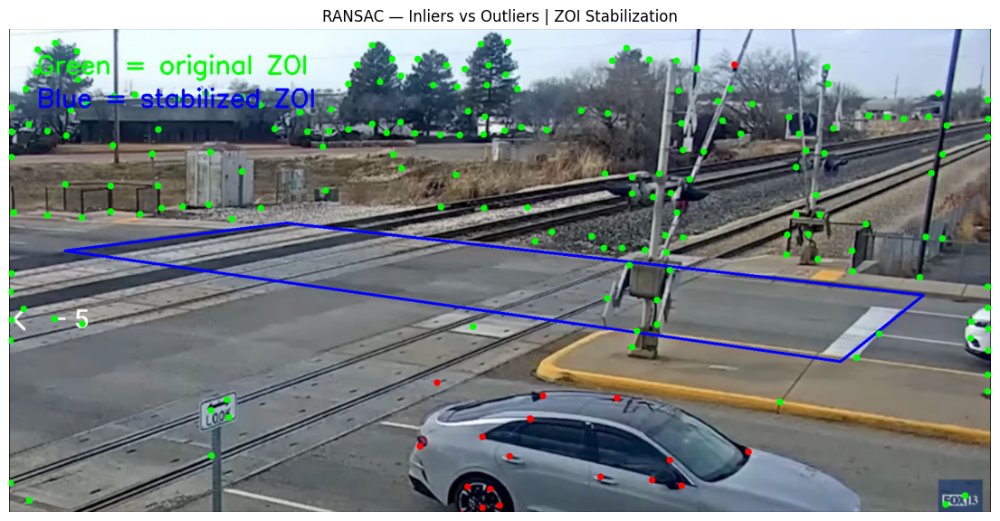

In [100]:
# Cell 6 - RANSAC Homography to Stabilize the ZOI
# Take the tracked points and compute a homography using RANSAC
H, mask_ransac = cv2.findHomography(
    good_old, good_new,
    cv2.RANSAC,
    ransacReprojThreshold=3.0  # max pixel error to be considered an inlier
)

# Separate inliers (stable background) from outliers (moving objects)
inliers = good_new[mask_ransac.ravel() == 1]
outliers = good_new[mask_ransac.ravel() == 0]

print(f"Total tracked points : {len(good_new)}")
print(f"Inliers  (background): {len(inliers)}")
print(f"Outliers (moving obj): {len(outliers)}")

# Warp the ZOI polygon using the homography to keep it locked to the tracks
zoi_float = zoi_points.astype(np.float32).reshape(-1, 1, 2)
zoi_stabilized = cv2.perspectiveTransform(zoi_float, H).reshape(-1, 2).astype(np.int32)

# Draw everything on frame 2
frame_ransac = frame2.copy()

# Original ZOI in green
cv2.polylines(frame_ransac, [zoi_points], isClosed=True, color=(0, 255, 0), thickness=3)

# Stabilized ZOI in blue
cv2.polylines(frame_ransac, [zoi_stabilized], isClosed=True, color=(255, 0, 0), thickness=3)

# Inlier points in green, outliers in red
for pt in inliers:
    cv2.circle(frame_ransac, tuple(pt.astype(int)), 6, (0, 255, 0), -1)
for pt in outliers:
    cv2.circle(frame_ransac, tuple(pt.astype(int)), 6, (0, 0, 255), -1)

# Legend
cv2.putText(frame_ransac, "Green = original ZOI", (50, 80),
            cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)
cv2.putText(frame_ransac, "Blue = stabilized ZOI", (50, 140),
            cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 3)

frame_rgb = cv2.cvtColor(frame_ransac, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(14, 8))
plt.imshow(frame_rgb)
plt.title("RANSAC — Inliers vs Outliers | ZOI Stabilization")
plt.axis("off")
plt.show()

Processing video...
  Captured: 0s  — Static crossing
  Captured: 7s  — SUV trapped on tracks
  Captured: 14s — Gate damaged
  Captured: 28s — Train entering frame

Done! Processed 1014 frames.


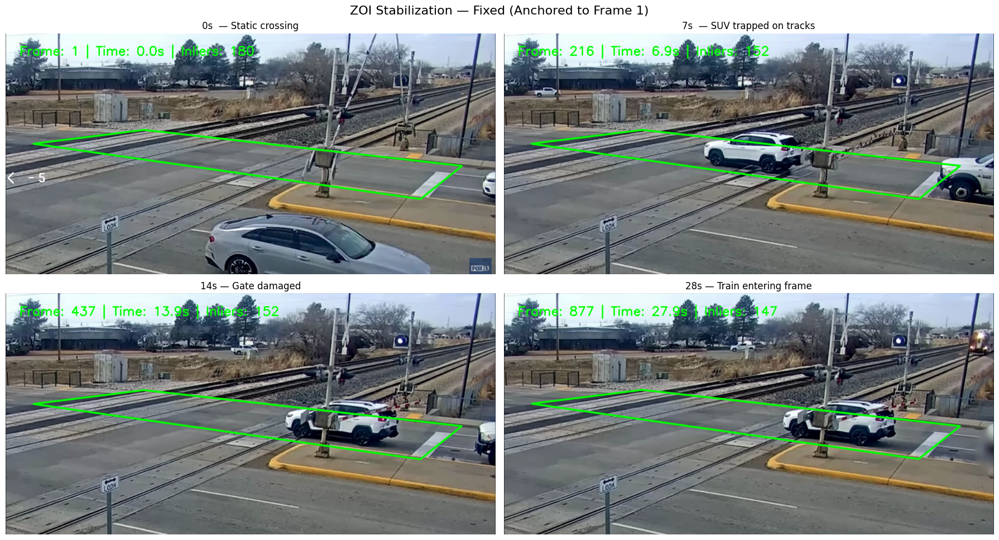

In [101]:
# Cell 7 - Fixed: ZOI Stabilization anchored to Frame 1 (no cumulative drift)
cap = cv2.VideoCapture(video_path)

# Read and store the first frame as our permanent anchor
ret, first_frame = cap.read()
first_gray = cv2.cvtColor(first_frame, cv2.COLOR_BGR2GRAY)
first_points = cv2.goodFeaturesToTrack(first_gray, **feature_params)

# Reset to beginning
cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, prev_frame = cap.read()
prev_gray = first_gray.copy()

fps = cap.get(cv2.CAP_PROP_FPS)
frame_count = 0
snapshots = {}

capture_times = {
    "0s  — Static crossing"          :  0,
    "7s  — SUV trapped on tracks"    :  7,
    "14s — Gate damaged"             : 14,
    "28s — Train entering frame"     : 28
}

print("Processing video...")

while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1
    current_time = frame_count / fps
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Always track from FIRST frame points to CURRENT frame
    curr_points, status, _ = cv2.calcOpticalFlowPyrLK(
        first_gray, gray, first_points, None, **lk_params
    )

    # Filter valid points
    good_first = first_points[status == 1]
    good_curr  = curr_points[status == 1]

    H = None
    inlier_count = 0

    if len(good_first) >= 4:
        # Homography from first frame to current frame directly
        H, mask_ransac = cv2.findHomography(
            good_first, good_curr,
            cv2.RANSAC,
            ransacReprojThreshold=3.0
        )
        if mask_ransac is not None:
            inlier_count = int(mask_ransac.sum())

    # Always warp from ORIGINAL zoi_points using the direct homography
    frame_drawn = frame.copy()
    if H is not None:
        zoi_reshaped = zoi_points.astype(np.float32).reshape(-1, 1, 2)
        zoi_stabilized = cv2.perspectiveTransform(zoi_reshaped, H).reshape(-1, 2).astype(np.int32)
        cv2.polylines(frame_drawn, [zoi_stabilized], isClosed=True, color=(0, 255, 0), thickness=5)
    else:
        # Fallback to original if homography fails
        cv2.polylines(frame_drawn, [zoi_points], isClosed=True, color=(0, 0, 255), thickness=5)

    cv2.putText(frame_drawn,
                f"Frame: {frame_count} | Time: {current_time:.1f}s | Inliers: {inlier_count}",
                (50, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)

    # Capture snapshots
    for label, target_sec in capture_times.items():
        if abs(current_time - target_sec) < (1 / fps) + 0.1:
            if label not in snapshots:
                snapshots[label] = cv2.cvtColor(frame_drawn, cv2.COLOR_BGR2RGB)
                print(f"  Captured: {label}")

cap.release()
print(f"\nDone! Processed {frame_count} frames.")

# Display snapshots
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
axes = axes.ravel()

for i, (label, img) in enumerate(snapshots.items()):
    axes[i].imshow(img)
    axes[i].set_title(label, fontsize=12)
    axes[i].axis("off")

plt.suptitle("ZOI Stabilization — Fixed (Anchored to Frame 1)", fontsize=16)
plt.tight_layout()
plt.show()

Training MOG2 on background...
MOG2 trained on 300 frames.


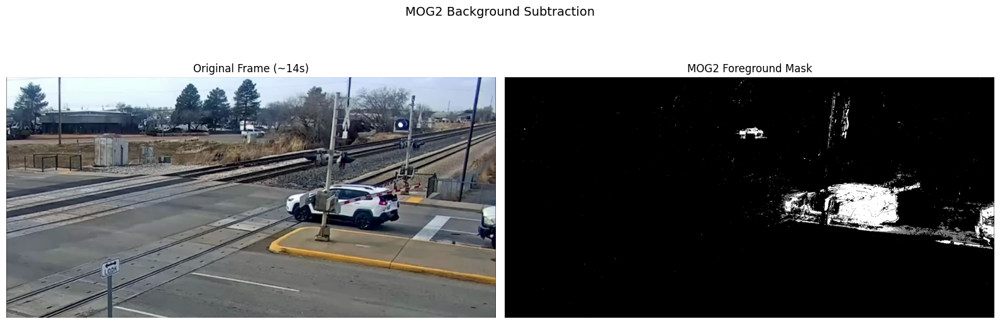

Mask shape: (872, 1772)
White pixels = detected anomalies, Gray = shadows, Black = background


In [102]:
# Cell 8 - MOG2 Background Subtraction Setup
# MOG2 learns what the "empty" crossing looks like from the first N frames
# After training, anything new that appears gets flagged as an anomaly

# Create the MOG2 background subtractor
mog2 = cv2.createBackgroundSubtractorMOG2(
    history=300,        # how many frames to use to learn the background
    varThreshold=50,    # how sensitive it is — higher = less sensitive
    detectShadows=True  # detect and mark shadows separately
)

# Train MOG2 on the first 300 frames (the static empty crossing)
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_count = 0
print("Training MOG2 on background...")
while frame_count < 300:
    ret, frame = cap.read()
    if not ret:
        break
    mog2.apply(frame)
    frame_count += 1
print(f"MOG2 trained on {frame_count} frames.")

# Jump to test frame dynamically using seconds instead of hardcoded frame number
test_time = 14  # seconds — change this to test different moments
test_frame_num = min(int(test_time * fps), total_frames - 1)
cap.set(cv2.CAP_PROP_POS_FRAMES, test_frame_num)
ret, test_frame = cap.read()
cap.release()

# Apply MOG2 to the test frame — returns a mask
fg_mask = mog2.apply(test_frame)

# Display the original frame and the mask side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(cv2.cvtColor(test_frame, cv2.COLOR_BGR2RGB))
axes[0].set_title(f"Original Frame (~{test_time}s)")
axes[0].axis("off")
axes[1].imshow(fg_mask, cmap="gray")
axes[1].set_title("MOG2 Foreground Mask")
axes[1].axis("off")
plt.suptitle("MOG2 Background Subtraction", fontsize=14)
plt.tight_layout()
plt.show()
print(f"Mask shape: {fg_mask.shape}")
print("White pixels = detected anomalies, Gray = shadows, Black = background")

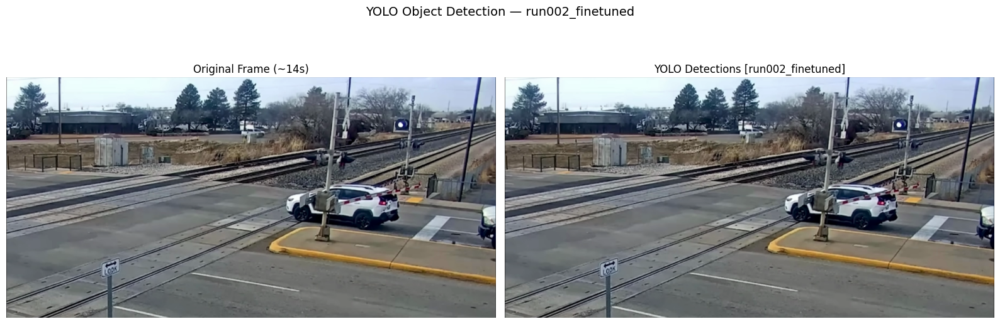

Objects detected by YOLO [run002_finetuned]:


In [103]:
# Cell 9 - YOLO Object Detection on the Same Test Frame
from ultralytics import YOLO

# Load the YOLO model — path set in Cell 1b
model = YOLO(MODEL_PATH)

# Run YOLO on the same test frame from Cell 8
results = model(test_frame, verbose=False)

# Draw bounding boxes on a copy of the frame
frame_yolo = test_frame.copy()
for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        class_name = model.names[int(box.cls[0])]
        confidence = float(box.conf[0])
        cv2.rectangle(frame_yolo, (x1, y1), (x2, y2), (255, 0, 0), 3)
        label = f"{class_name} {confidence:.2f}"
        cv2.putText(frame_yolo, label, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 0, 0), 3)

# Display original and YOLO result side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(cv2.cvtColor(test_frame, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Frame (~14s)")
axes[0].axis("off")
axes[1].imshow(cv2.cvtColor(frame_yolo, cv2.COLOR_BGR2RGB))
axes[1].set_title(f"YOLO Detections [{RUN_LABEL}]")
axes[1].axis("off")
plt.suptitle(f"YOLO Object Detection — {RUN_LABEL}", fontsize=14)
plt.tight_layout()
plt.show()

# Print detections
print(f"Objects detected by YOLO [{RUN_LABEL}]:")
for result in results:
    for box in result.boxes:
        class_name = model.names[int(box.cls[0])]
        confidence = float(box.conf[0])
        print(f"  - {class_name}: {confidence:.2f} confidence")


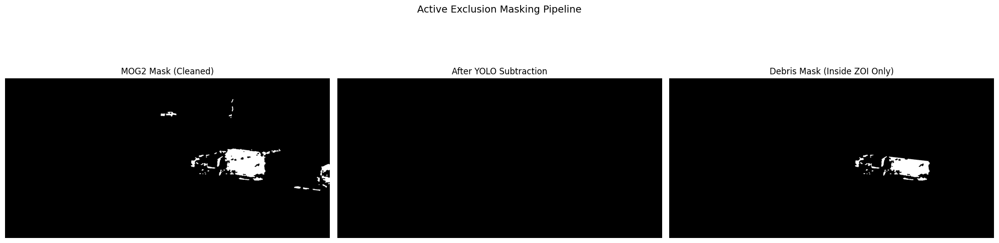

Anomalous pixels inside ZOI after YOLO subtraction: 20805
ZOI total pixels: 155276
Debris coverage: 13.40%


In [104]:
# Cell 10 - Active Exclusion Masking (MOG2 - YOLO = Unknown Objects)

# Step 1: Clean up the MOG2 mask
_, fg_mask_clean = cv2.threshold(fg_mask, 200, 255, cv2.THRESH_BINARY)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
fg_mask_clean = cv2.morphologyEx(fg_mask_clean, cv2.MORPH_OPEN,  kernel)
fg_mask_clean = cv2.morphologyEx(fg_mask_clean, cv2.MORPH_CLOSE, kernel)

# Step 2: Build ZOI mask and check vehicles using helper functions
zoi_mask = build_zoi_mask(test_frame.shape, zoi_points)
vehicle_in_zoi, vehicle_labels, exclusion_mask = check_vehicle_in_zoi(results, zoi_mask, test_frame.shape)

# Step 3: Get debris mask using helper function
debris_mask = get_debris_mask(fg_mask_clean, exclusion_mask, zoi_mask)

# Display all three steps
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes[0].imshow(fg_mask_clean, cmap="gray")
axes[0].set_title("MOG2 Mask (Cleaned)")
axes[0].axis("off")
axes[1].imshow(exclusion_mask, cmap="gray")
axes[1].set_title("After YOLO Subtraction")
axes[1].axis("off")
axes[2].imshow(debris_mask, cmap="gray")
axes[2].set_title("Debris Mask (Inside ZOI Only)")
axes[2].axis("off")
plt.suptitle("Active Exclusion Masking Pipeline", fontsize=14)
plt.tight_layout()
plt.show()

# Count anomalous pixels inside ZOI
debris_pixel_count = cv2.countNonZero(debris_mask)
zoi_pixel_count    = cv2.countNonZero(zoi_mask)
print(f"Anomalous pixels inside ZOI after YOLO subtraction: {debris_pixel_count}")
print(f"ZOI total pixels: {zoi_pixel_count}")
print(f"Debris coverage: {(debris_pixel_count / zoi_pixel_count) * 100:.2f}%")

=== Safety Logic Evaluation ===
Anomalous pixels inside ZOI : 20805
Area threshold              : 5000 pixels
Time threshold (debris)     : 3.0 seconds
Time threshold (vehicle)    : 5.0 seconds
Vehicle detected in ZOI     : False

STATUS: ALARM
Debris coverage: 13.40%


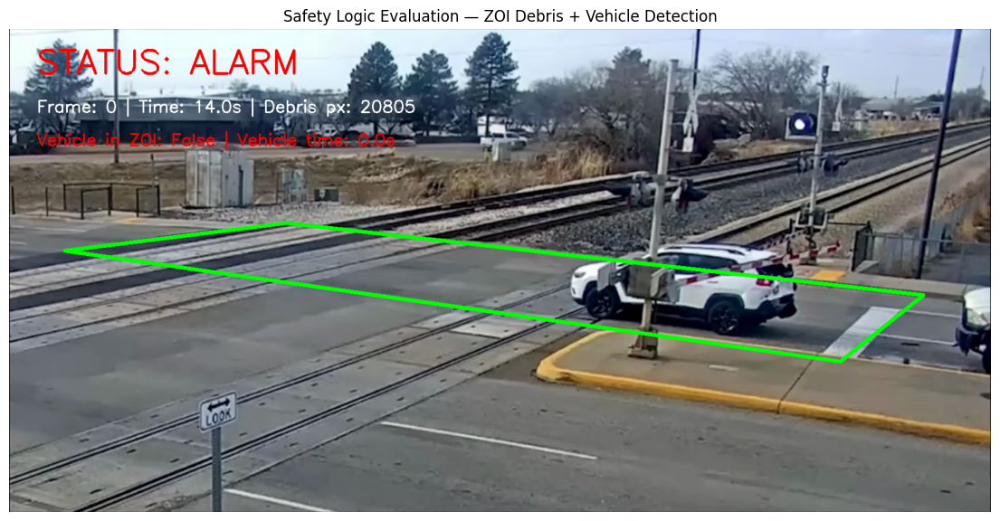

In [105]:
# Cell 11 - Safety Logic: Area Threshold + Vehicle-in-ZOI Check

# Safety thresholds
AREA_THRESHOLD    = 5000  # minimum pixel area for unknown debris
TIME_THRESHOLD    = 3.0   # seconds debris must persist before alarm
VEHICLE_THRESHOLD = 5.0   # seconds a known vehicle can stay in ZOI before alarm

# Count pixels
debris_pixel_count = cv2.countNonZero(debris_mask)
zoi_pixel_count    = cv2.countNonZero(zoi_mask)

# Evaluate status using helper functions (no timers on single frame)
status_text, status_color = evaluate_status(
    debris_time=0.0,
    vehicle_time=0.0,
    vehicle_in_zoi=vehicle_in_zoi,
    TIME_THRESHOLD=TIME_THRESHOLD,
    VEHICLE_THRESHOLD=VEHICLE_THRESHOLD
)

# Override if debris exceeds area threshold
if debris_pixel_count >= AREA_THRESHOLD:
    status_text  = "ALARM"
    status_color = (0, 0, 255)

# Print evaluation
print("=== Safety Logic Evaluation ===")
print(f"Anomalous pixels inside ZOI : {debris_pixel_count}")
print(f"Area threshold              : {AREA_THRESHOLD} pixels")
print(f"Time threshold (debris)     : {TIME_THRESHOLD} seconds")
print(f"Time threshold (vehicle)    : {VEHICLE_THRESHOLD} seconds")
print(f"Vehicle detected in ZOI     : {vehicle_in_zoi}")
if vehicle_in_zoi:
    print(f"Vehicle labels              : {', '.join(vehicle_labels)}")
print()
print(f"STATUS: {status_text}")
print(f"Debris coverage: {(debris_pixel_count / zoi_pixel_count) * 100:.2f}%")

# Visualize using draw_frame helper
frame_safety = draw_frame(
    frame=test_frame,
    zoi_stabilized=zoi_points,
    yolo_results=results,
    zoi_mask=zoi_mask,
    status_text=status_text,
    status_color=status_color,
    frame_count=0,
    current_time=14.0,
    debris_count=debris_pixel_count,
    vehicle_in_zoi=vehicle_in_zoi,
    vehicle_time=0.0
)

plt.figure(figsize=(14, 8))
plt.imshow(cv2.cvtColor(frame_safety, cv2.COLOR_BGR2RGB))
plt.title("Safety Logic Evaluation — ZOI Debris + Vehicle Detection")
plt.axis("off")
plt.show()

Training MOG2...
MOG2 ready.
Processing full pipeline...
  Captured: 0s  — SUV entering as gates come down
  *** ALARM first triggered at t=3.50s ***
  Captured: 7s  — SUV fully trapped on tracks
  Captured: 14s — Gate damaged, SUV still on tracks
  Captured: 28s — Train entering frame

Done! Processed 1015 frames.

  PIPELINE RESULTS — run002_finetuned
  First ALARM triggered : t = 3.50s
  ZOI detections        : 171 total
  Avg confidence        : 0.402
  Min / Max confidence  : 0.129 / 0.902

  Status breakdown (1015 frames total):
    ALARM       :   766 frames  (75.5%)
    CLEAR       :    59 frames  (5.8%)



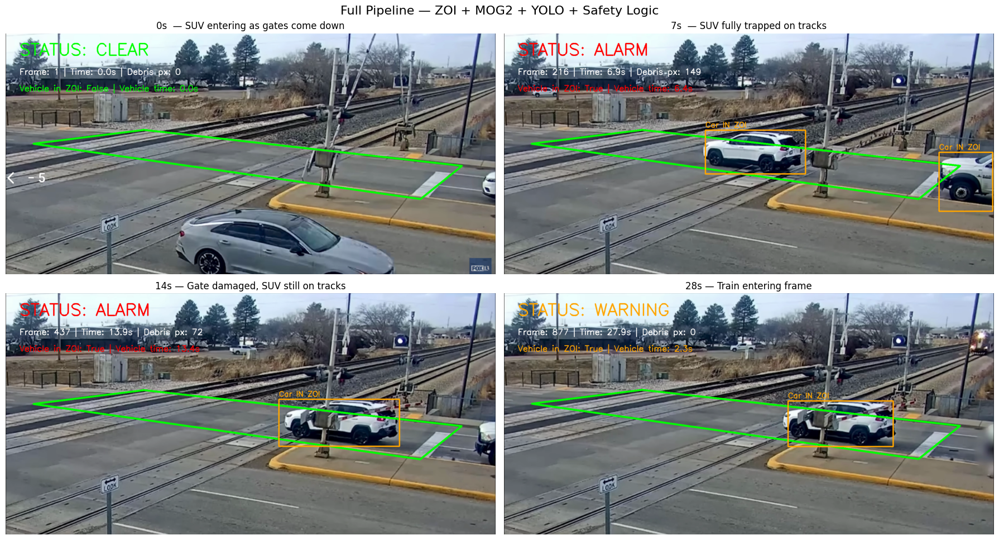

In [106]:
# Cell 12 - Full Pipeline: ZOI + MOG2 + YOLO + Safety Logic (with Vehicle Timer)
# Safety thresholds
AREA_THRESHOLD    = 5000
TIME_THRESHOLD    = 3.0
VEHICLE_THRESHOLD = 3.0

# Train MOG2
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
mog2 = cv2.createBackgroundSubtractorMOG2(history=300, varThreshold=50, detectShadows=True)
frame_count = 0
print("Training MOG2...")
while frame_count < 300:
    ret, frame = cap.read()
    if not ret:
        break
    mog2.apply(frame)
    frame_count += 1
print("MOG2 ready.")

# Reset to beginning
cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

# Timers and tracking
debris_timer_start  = None
vehicle_timer_start = None
frame_count = 0
snapshots   = {}

# --- Results Logging ---
from collections import Counter
alarm_first_triggered = None
confidence_log = []   # (time, class_name, confidence) for ZOI detections
status_log     = []   # (time, status_text) every frame

capture_times = {
    "0s  — SUV entering as gates come down" :  0,
    "7s  — SUV fully trapped on tracks"     :  7,
    "14s — Gate damaged, SUV still on tracks": 14,
    "28s — Train entering frame"             : 28
}

print("Processing full pipeline...")
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1
    current_time = frame_count / fps

    # ZOI Stabilization
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    zoi_stabilized = stabilize_zoi(gray, first_gray, first_points, lk_params, zoi_points)
    zoi_mask_full  = np.zeros(frame.shape[:2], dtype=np.uint8)
    cv2.fillPoly(zoi_mask_full, [zoi_stabilized], 255)

    # MOG2
    fg_mask = apply_mog2_mask(frame, mog2)
    if frame_count == 1:
        yolo_results   = []
        vehicle_in_zoi = False
        vehicle_labels = []
        exclusion_mask = np.zeros(frame.shape[:2], dtype=np.uint8)

    # YOLO + Vehicle Check (every 5 frames for speed)
    if frame_count % 5 == 0:
        yolo_results = model.track(frame, persist=True, tracker="bytetrack.yaml", verbose=False)
        vehicle_in_zoi, vehicle_labels, exclusion_mask = check_vehicle_in_zoi(
            yolo_results, zoi_mask_full, frame.shape
        )
        # Log detection confidence for vehicles inside ZOI
        for result in yolo_results:
            if result.boxes is not None:
                for box in result.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    cx, cy = (x1 + x2) // 2, (y1 + y2) // 2
                    if zoi_mask_full[cy, cx] > 0:
                        confidence_log.append((
                            current_time,
                            model.names[int(box.cls[0])],
                            float(box.conf[0])
                        ))
    # On skipped frames, keep the last known YOLO results
    else:
        pass

    # Debris Mask
    debris_mask  = get_debris_mask(fg_mask, exclusion_mask, zoi_mask_full)
    debris_count = cv2.countNonZero(debris_mask)

    # Vehicle Timer
    if vehicle_in_zoi:
        if vehicle_timer_start is None:
            vehicle_timer_start = current_time
        vehicle_time = current_time - vehicle_timer_start
    else:
        vehicle_timer_start = None
        vehicle_time = 0.0

    # Debris Timer
    if debris_count >= AREA_THRESHOLD:
        if debris_timer_start is None:
            debris_timer_start = current_time
        debris_time = current_time - debris_timer_start
    else:
        debris_timer_start = None
        debris_time = 0.0


    # Status — timer-gated alarm logic (vehicle must exceed threshold before ALARM)
    if vehicle_in_zoi and vehicle_time >= VEHICLE_THRESHOLD:
        status_text  = "ALARM"
        status_color = (0, 0, 255)
    elif debris_time >= TIME_THRESHOLD:
        status_text  = "ALARM"
        status_color = (0, 0, 255)
    else:
        status_text, status_color = evaluate_status(
            debris_time, vehicle_time, vehicle_in_zoi,
            TIME_THRESHOLD, VEHICLE_THRESHOLD
        )

    # Log status and first alarm time
    status_log.append((current_time, status_text))
    if status_text == "ALARM" and alarm_first_triggered is None:
        alarm_first_triggered = current_time
        print(f"  *** ALARM first triggered at t={current_time:.2f}s ***")

    # Draw Frame
    frame_drawn = draw_frame(
        frame, zoi_stabilized, yolo_results, zoi_mask_full,
        status_text, status_color, frame_count, current_time,
        debris_count, vehicle_in_zoi, vehicle_time
    )

    # Snapshots
    for label, target_sec in capture_times.items():
        if abs(current_time - target_sec) < (1 / fps) + 0.1:
            if label not in snapshots:
                snapshots[label] = cv2.cvtColor(frame_drawn, cv2.COLOR_BGR2RGB)
                print(f"  Captured: {label}")

cap.release()
print(f"\nDone! Processed {frame_count} frames.")

# --- Print Results Summary ---
import statistics
print(f"\n{'='*45}")
print(f"  PIPELINE RESULTS — {RUN_LABEL}")
print(f"{'='*45}")

if alarm_first_triggered is not None:
    print(f"  First ALARM triggered : t = {alarm_first_triggered:.2f}s")
else:
    print(f"  First ALARM triggered : Never")

if confidence_log:
    confs = [c for _, _, c in confidence_log]
    print(f"  ZOI detections        : {len(confidence_log)} total")
    print(f"  Avg confidence        : {statistics.mean(confs):.3f}")
    print(f"  Min / Max confidence  : {min(confs):.3f} / {max(confs):.3f}")
else:
    print(f"  ZOI detections        : 0")

status_counts = Counter(s for _, s in status_log)
print(f"\n  Status breakdown ({frame_count} frames total):")
for s, count in sorted(status_counts.items()):
    print(f"    {s:<12}: {count:>5} frames  ({count/frame_count*100:.1f}%)")
print(f"{'='*45}\n")

# Display
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
axes = axes.ravel()
for i, (label, img) in enumerate(snapshots.items()):
    axes[i].imshow(img)
    axes[i].set_title(label, fontsize=12)
    axes[i].axis("off")
plt.suptitle("Full Pipeline — ZOI + MOG2 + YOLO + Safety Logic", fontsize=16)
plt.tight_layout()
plt.show()